C:\Users\SANDRO\Anaconda3\lib\site-packages\ipykernel_launcher.py:36: UserWarning: No contour levels were found within the data range.
C:\Users\SANDRO\Anaconda3\lib\site-packages\ipykernel_launcher.py:42: UserWarning: No contour levels were found within the data range.
C:\Users\SANDRO\Anaconda3\lib\site-packages\ipykernel_launcher.py:48: UserWarning: No contour levels were found within the data range.


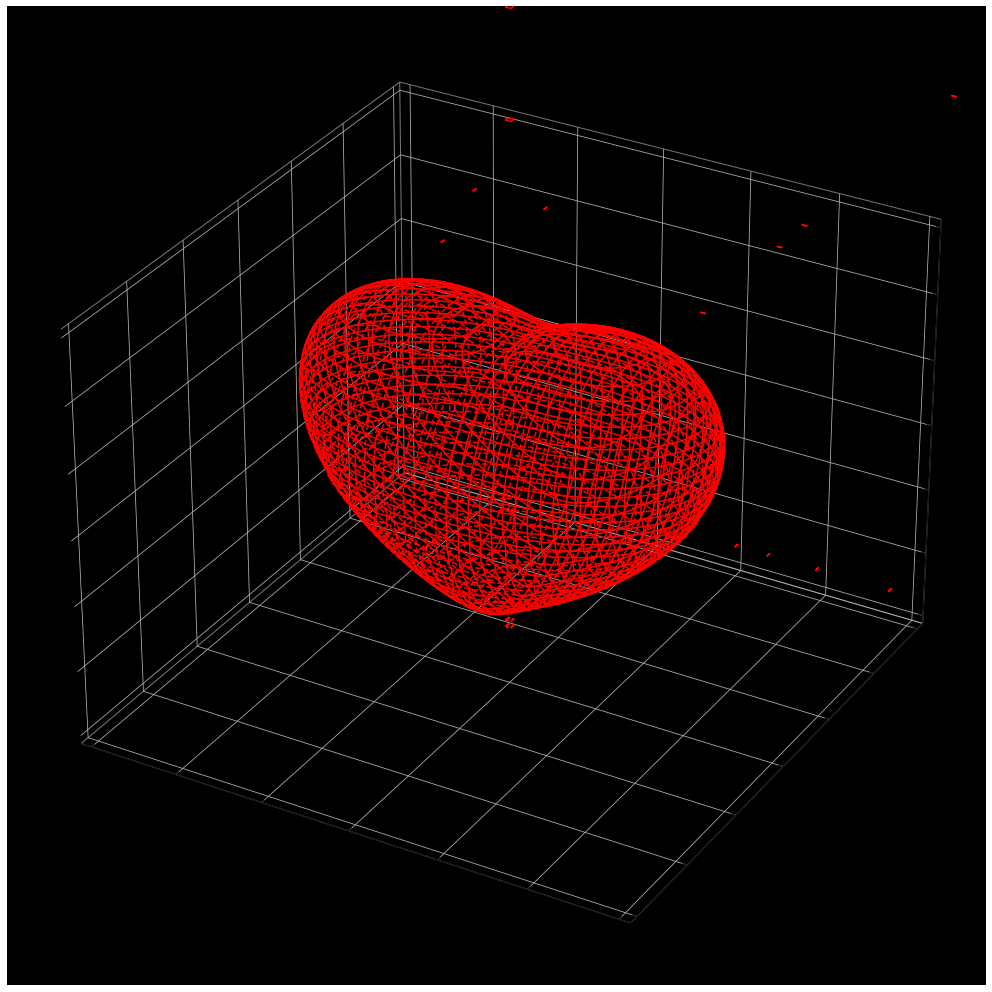

In [1]:
from matplotlib import animation
import matplotlib.pyplot as plt
import numpy as np
from IPython.display import HTML

# Definir la función que genera la superficie del corazón
def corazon_3d(x,y,z):
    a = (x**2 + (9/4)*(y**2) + z**2 - 1)**3
    b = x**2*z**3
    c = (9/80)*(y**2)*(z**3)
    return a - b - c

# Crear la figura y el eje 3D
bbox=(-1.5, 1.5)
xmin, xmax, ymin, ymax, zmin, zmax = bbox*3
fig = plt.figure(figsize=(18, 18))
ax = fig.add_subplot(111, projection='3d')
ax.set_facecolor('black')
ax.xaxis.pane.fill = False
ax.yaxis.pane.fill = False
ax.zaxis.pane.fill = False

ax.set_zlim3d(zmin, zmax)
ax.set_xlim3d(xmin, xmax)
ax.set_ylim3d(ymin, ymax)

# Inicializar la superficie del corazón
A = np.linspace(xmin, xmax, 100) 
B = np.linspace(xmin, xmax, 50)
A1, A2 = np.meshgrid(A, A)

for z in B:
    X, Y = A1, A2
    Z = corazon_3d(X, Y, z)
    cset = ax.contour(X, Y, Z+z, [z],
                      zdir='z', colors=('red'))

for y in B:
    X, Z = A1, A2
    Y = corazon_3d(X, y, Z)
    cset = ax.contour(X, Y+y, Z, [y],
                      zdir='y', colors=('red'))

for x in B:
    Y, Z = A1, A2
    X = corazon_3d(x, Y, Z)
    cset = ax.contour(X+x, Y, Z, [x],
                      zdir='x',colors=('red'))

In [2]:
# Definir la función de animación
def animate(i):
    ax.view_init(elev=10., azim=i)
    return fig,

# Crear la animación
anim = animation.FuncAnimation(fig,
                               animate,
                               frames=360,
                               interval=20,
                               blit=True)

# Guardar la animación
anim.save('3D_heart.mp4', fps=30, extra_args=['-vcodec', 'libx264'])

# Mostrar la animación
HTML(anim.to_html5_video())